In [15]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import ast
from PIL import Image
import json

In [16]:
df = pd.read_csv('../Data/Masterchef.csv')
post_list = np.load("../Data/MasterChef.npy",allow_pickle=True)
post_list = post_list.tolist()

In [17]:
df.shape[0]

300

In [18]:
df = df[df['comments'] > 0]
df.reset_index(drop=True, inplace=True)


In [19]:
df.shape[0]

178

In [20]:
df['comments']

0       15
1       11
2        3
3       42
4        5
      ... 
173     55
174    250
175     59
176    590
177     92
Name: comments, Length: 178, dtype: int64

In [21]:
df['comments_full']

0      [{'comment_id': '1105075617325952', 'comment_u...
1      [{'comment_id': '851313496470638', 'comment_ur...
2                                                     []
3      [{'comment_id': '315572947904464', 'comment_ur...
4                                                     []
                             ...                        
173    [{'comment_id': '7788240534582333', 'comment_u...
174    [{'comment_id': '538416521362804', 'comment_ur...
175    [{'comment_id': '454632359844112', 'comment_ur...
176    [{'comment_id': '597547501938241', 'comment_ur...
177    [{'comment_id': '743313143663398', 'comment_ur...
Name: comments_full, Length: 178, dtype: object

### 5 bài có nhiều comments nhất

In [22]:
top_comments_df = df.nlargest(5, 'comments')
top_comments_df['comments']

123    2698
14     2011
130    1740
127    1267
17     1101
Name: comments, dtype: int64

### Số lượng comments trung bình của mỗi bài

In [23]:
average_comments = df['comments'].mean()
print(f'Average number of comments: {average_comments:.2f}')


Average number of comments: 215.22


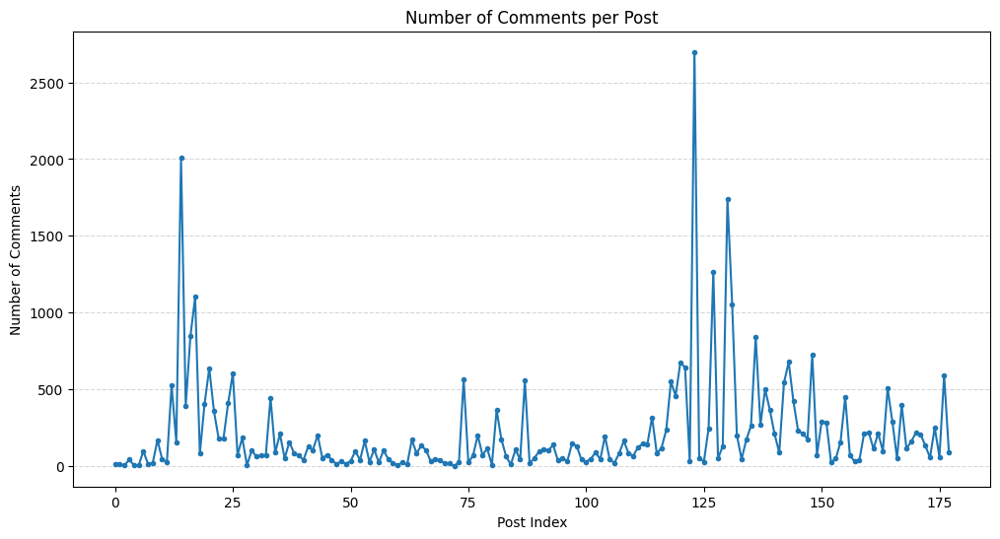

In [24]:
import matplotlib.pyplot as plt
plt.figure(figsize=(12, 6))
plt.plot(df['comments'], marker='.')
plt.title('Number of Comments per Post')
plt.xlabel('Post Index')
plt.ylabel('Number of Comments')
plt.grid(True, which='both', axis='y', linestyle='--', alpha=0.5)
plt.show()

In [25]:
res=[]
for post in post_list:
    if len(post['comments_full']) > 0:
      print(post['comments_full'])
      cmt = '\n'.join([comment['comment_text'] for comment in post['comments_full'] ])
      res.append(cmt)


[{'comment_id': '1105075617325952', 'comment_url': 'https://facebook.com/1105075617325952', 'commenter_id': '100009881505236', 'commenter_url': 'https://facebook.com/michelefred.karabin?eav=AfasVvoGlUTZW8N3gFYDsSWqEVx9uLwRyBQYNoJoN0Y2SwQTjiUADhbOzvg_pBtteXg&fref=nf&rc=p&refid=52&__tn__=R&paipv=0', 'commenter_name': 'Michele Fred Karabin', 'commenter_meta': None, 'comment_text': 'Season 13 🙌🏻 great, talented and beautiful people 🫶🏻', 'comment_time': None, 'comment_image': 'https://scontent.fhan14-4.fna.fbcdn.net/m1/v/t6/An-9fyYLftTy_Mg2cJpugh-vEVNfbtI-fVn4FNS7K-sgIMu9pT62Tb1u9Dfm-xYLtjbLQk-yVHp_IlY_4iMVYp0xLpO7sJvbxbC2OIiRxzS02cOuKEoo.png?ccb=10-5&oh=00_AfC150_jxfxc8_QZ2bAepCnNkuASCElL274LhY85i3wxCg&oe=658A22D8&_nc_sid=7da55a', 'comment_reactors': [{'name': 'Waralee22', 'link': 'https://facebook.com/profile.php?id=61550323302683&eav=AfZ8DIJJ4yZOaEGfMB4iZ06IbpHuC-muhn_FMMhPdWQDeZO9wMjQrgNCFPHk1QKF8DU&fref=pb&paipv=0', 'type': 'care'}], 'comment_reactions': {'care': 1}, 'comment_reaction_

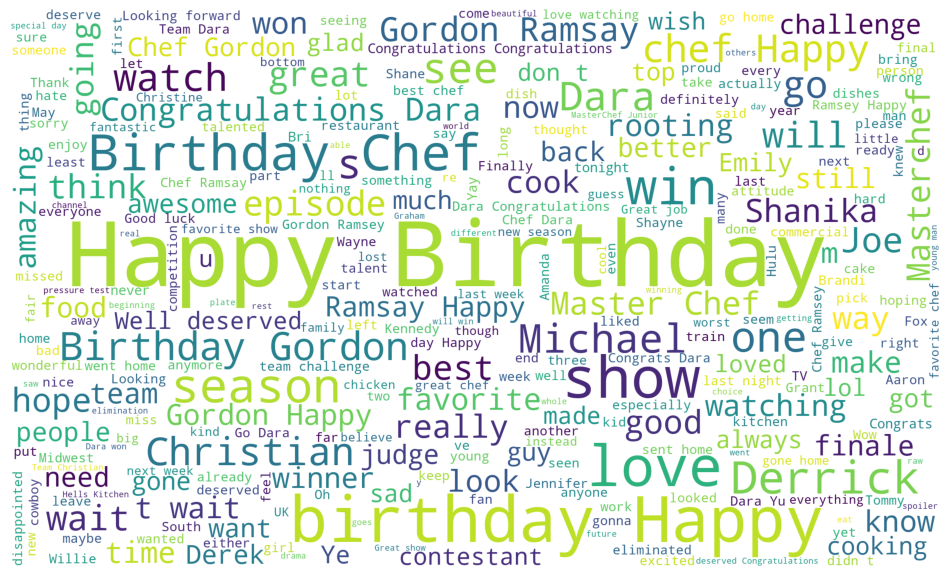

In [26]:
text = ''
for i in res:
    i = str(i)
    text=text+i+'\n'
text
from wordcloud import WordCloud, STOPWORDS

wordcloud = WordCloud(stopwords=STOPWORDS,
                          background_color='white', 
                      max_words=300,
                      width = 2000, height=1200
                         ).generate(text)
plt.figure(figsize=(12,10))
plt.clf()
plt.imshow(wordcloud)
plt.axis('off')
plt.show()

### Biểu đồ về COMMENTS VÀ REACTION_count

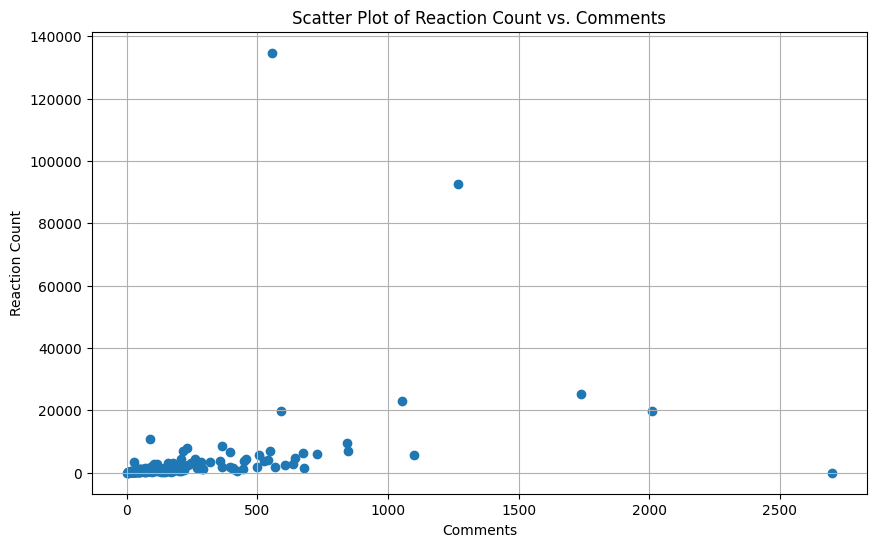

In [27]:
plt.figure(figsize=(10, 6))
plt.scatter(df['comments'], df['reaction_count'])
plt.title('Scatter Plot of Reaction Count vs. Comments')
plt.xlabel('Comments')
plt.ylabel('Reaction Count')
plt.grid(True)
plt.show()

In [28]:
# Truy xuất nội dung bài đăng có lượng comment nhiều nhất từ DataFrame top_comments_df
most_commented_post_text = top_comments_df['post_text'].iloc[0]

print("Most Commented Post Text:")
print(most_commented_post_text)


Most Commented Post Text:
Happy birthday to you, Gordon Ramsay!

Season 1 ➡️ Season 12.
